In [1]:
using Plots
using StatsBase
using Base.Threads

## Precipitation

In [3]:
function Precipitating_Automata(nt::Int, L::Int, θ::Vector{Int}, IC::Matrix{Int64})
    θ1 , θ2 = θ
    domain = zeros(Int, nt, L, L)
    domain[1, :, :] .= IC
    
    for t = 1:nt-1 , i = 2:L-1 , j = 2:L-1
        σ = sum(domain[t, i-1:i+1, j-1:j+1]) - domain[t, i, j]
        if domain[t, i, j] == 0 && σ <= θ2 && σ >= θ1 || domain[t , i , j] == 1
            domain[t+1, i, j] = 1
        else
            domain[t+1, i, j] = 0
        end
    end
    return domain
end

function Precipitating_Automata_Random(nt::Int, L::Int, θ::Vector{Int} , IC::Matrix{Int64} , p::Float64 = .5)
    θ1 , θ2 = θ
    domain = zeros(Int, nt, L, L)
    domain[1, :, :] .= IC
    
    for t = 1:nt-1 , i = 2:L-1 , j = 2:L-1
        σ = sum(domain[t, i-1:i+1, j-1:j+1]) - domain[t, i, j]
        if rand() < p && domain[t, i, j] == 0 && σ <= θ2 && σ >= θ1 || domain[t , i , j] == 1
            domain[t+1, i, j] = 1
        else
            domain[t+1, i, j] = 0
        end
    end
    return domain
end

function makefig_precipitating(nt::Int , L::Int , θ1::Int , θ2::Int , IC::Matrix{Int64} , p::Float64 = .5 , single::Bool = true)
    domain1 = Precipitating_Automata(nt, L, [θ1, θ2], IC)
    domain2 = Precipitating_Automata_Random( nt, L, [θ1, θ2], IC , p )

    p1 = heatmap( domain1[end,:,:] , color=:bukavu , title = "Deterministic Rule")
    p2 = heatmap( domain2[end,:,:] , color=:bukavu , title = "Random Rule , p = $(p)")
    p3 = plot( sum( domain1 , dims=(2,3))[:] , label = "Deterministic" )
    plot!( sum( domain2 , dims=(2,3))[:] , label = "Random Rule" )
    
    plot( p1 , p2 , p3 , size = (1800,600) , layout=(1,3) , colorbar = false , suptitle = "θ1=$(θ1) , θ2=$(θ2)")
    if single
        savefig("Precipitation_Single/single_$(θ1)$(θ2).png")
    else
        savefig("Precipitation_Rand/rand_$(θ1)$(θ2).png")
    end  
end

makefig_precipitating (generic function with 3 methods)

In [4]:
nt = 200
L = 201
p = .5

0.5

In [10]:
IC = zeros(Int,L, L)
IC[L÷2+1 , L÷2+1] = 1 

@Threads.threads for θ2 = 1:2
        for θ1 = 1:θ2
            makefig_precipitating(nt,L,θ1,θ2,IC,p,true)
        end
    end

In [5]:
IC = rand( [0,1] , L , L )
@Threads.threads for θ2 = 1:9 
    for θ1 = 1:θ2
        makefig_precipitating(nt,L,θ1,θ2,IC,p,false)
    end
end

## Association

In [6]:
function Association_Automata(nt::Int, L::Int, θ::Vector{Int} , δ::Vector{Int}, IC::Matrix{Int64})
    θ1 , θ2 = θ
    δ1 , δ2 = δ
    domain = zeros(Int, nt, L, L)
    domain[1, :, :] .= IC
    
    for t = 1:nt-1 , i = 2:L-1 , j = 2:L-1
        σ = sum(domain[t, i-1:i+1, j-1:j+1]) - domain[t, i, j]
        if (domain[t, i, j] == 0 && σ <= θ2 && σ >= θ1) || (domain[t , i , j] == 1 && σ <= δ2 && σ >= δ1)
            domain[t+1, i, j] = 1
        else
            domain[t+1, i, j] = 0
        end
    end
    return domain
end

function Association_Automata_Random(nt::Int, L::Int, θ::Vector{Int} , δ::Vector{Int}, IC::Matrix{Int64} , p = .5)
    θ1 , θ2 = θ
    δ1 , δ2 = δ
    domain = zeros(Int, nt, L, L)
    domain[1, :, :] .= IC
    
    for t  = 1:nt-1 , i = 2:L-1 , j = 2:L-1
        σ = sum(domain[t, i-1:i+1, j-1:j+1]) - domain[t, i, j]
        if rand() < p && (domain[t, i, j] == 0 && σ <= θ2 && σ >= θ1) || (domain[t , i , j] == 1 && σ <= δ2 && σ >= δ1)
            domain[t+1, i, j] = 1
        else
            domain[t+1, i, j] = 0
        end
    end
    return domain
end

function makefig_association(nt::Int , L::Int , θ::Vector{Int} , δ::Vector{Int} , IC::Matrix{Int64} , p::Float64 = .5 , single::Bool = true)
    domain1 = Association_Automata(nt, L, θ , δ, IC)
    domain2 = Association_Automata_Random( nt, L, θ , δ , IC , .5 )

    p1 = heatmap( domain1[end,:,:] , color=:bukavu , title = "Deterministic Rule")
    p2 = heatmap( domain2[end,:,:] , color=:bukavu , title = "Random Rule , p = $(p)")
    p3 = plot( sum( domain1 , dims=(2,3))[:] , label = "Deterministic" )
    plot!( sum( domain2 , dims=(2,3))[:] , label = "Random Rule" )
    
    plot( p1 , p2 , p3 , size = (1800,600) , layout=(1,3) , colorbar = false , suptitle = "θ=$(θ) , δ=$(δ)")
    if single
        savefig("Association_Single/single_$(θ[1])$(θ[2])_$(δ[1])$(δ[2]).png")
    else
        savefig("Association_Rand/rand_$(θ[1])$(θ[2])_$(δ[1])$(δ[2]).png")
    end  
end

makefig_association (generic function with 3 methods)

In [7]:
nt = 700
L = 201
p = .5

0.5

┌ Info: Saved animation to /tmp/jl_RM5KHSzkfg.gif
└ @ Plots /home/lucas/.julia/packages/Plots/Ec1L1/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_RM5KHSzkfg.gif")
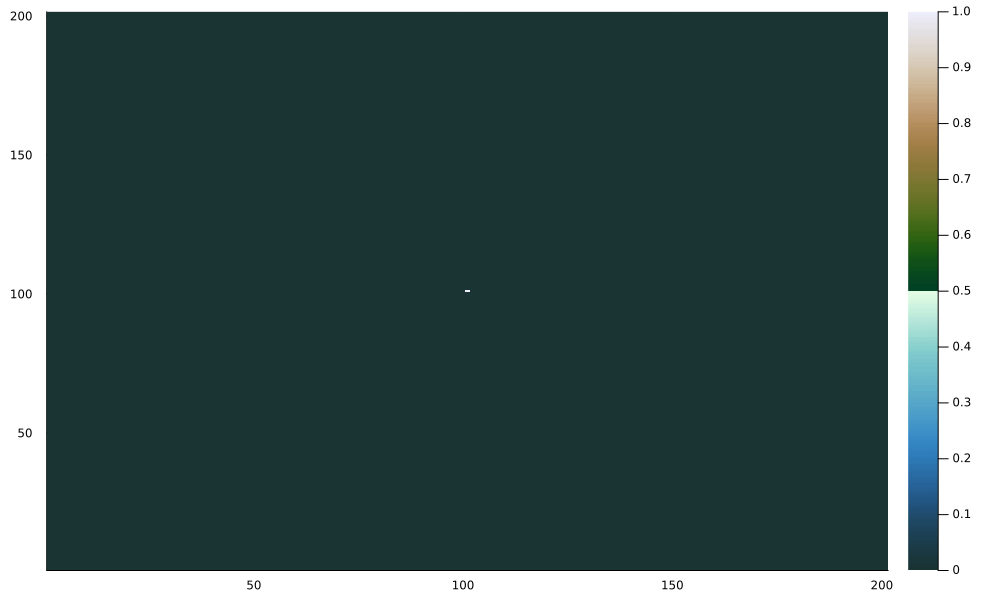

In [10]:
IC = zeros(Int,L, L)
IC[L÷2+1 , L÷2+1]  = 1

θ = [1,3]
δ = [3,7]
p = .5
domain1 = Association_Automata_Random(nt, L, θ, δ , IC , p)

@gif for t = 1:nt
    heatmap( transpose(domain1[t,:,:]) , color=:bukavu , size = (1000,600) )
end fps = 5

In [ ]:
IC = zeros(Int,L, L)
IC[L÷2+1 , L÷2+1] = 1 
@Threads.threads for θ2 in 1:9
    for θ1 in 1:θ2
        for δ2 in 1:9
            for δ1 in 1:δ2
                makefig_association(nt, L, [θ1, θ2], [δ1, δ2], IC, p, true)
            end
        end
    end
end

In [ ]:
IC = rand( [0,1] , L , L )
for θ2 = 1:9 , θ1 = 1:θ2 , δ2 = 1:9 , δ1 = 1:δ2 
    makefig_association(nt,L,[θ1,θ2] , [δ1,δ2] , IC,p,false)
end

In [11]:
nt = 200
L = 100
p = .1
IC = sample( [0,1] , Weights([1-p,p]) ,(L,L))
θ = [ 1, 8 ]
δ = [ 1, 3 ]

domain1 = Association_Automata(nt, L, θ , δ, IC)
domain2 = Association_Automata_Random( nt, L, θ , δ , IC , .5 );

┌ Info: Saved animation to /tmp/jl_xGbcRo1UF0.gif
└ @ Plots /home/lucas/.julia/packages/Plots/Ec1L1/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_xGbcRo1UF0.gif")
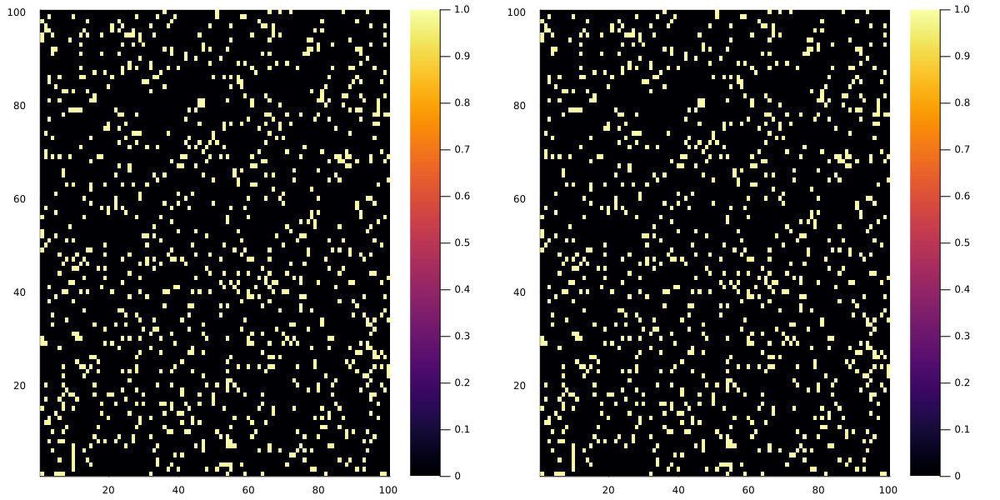

In [80]:
@gif for t in 1:nt
    p1 = heatmap( domain1[t,:,:] ,size = (1200,600) )
    p2 = heatmap( domain2[t,:,:] ,size = (1200,600) )
    plot( p1 , p2 )
end

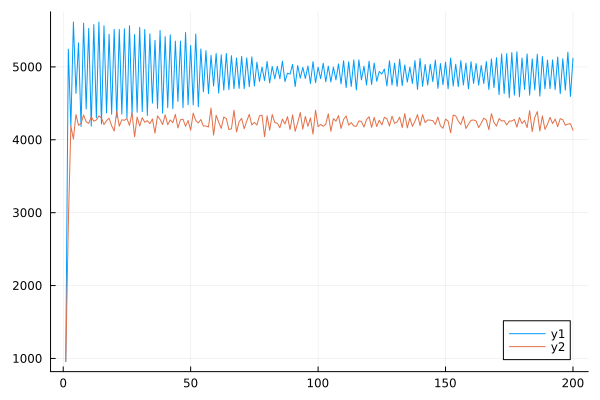

In [83]:
plot( sum( domain1 , dims=(2,3))[:,:,1] )
plot!( sum( domain2 , dims=(2,3))[:,:,1] )